# scATAC Integrate

scRNA + scATAC integrate.

1. scATAC `metadata.tsv` with UMAP/densMAP coordinates and total fragments/insertions.
2. Single-cell counts matrix derived from snapATAC with corresponding peaks.
3. scRNA Seurat rds
4. GTF

In [1]:
library(Matrix)
library(ggplot2)
library(patchwork)
library(GenomicRanges)
library(scales)
library(RColorBrewer)
library(DESeq2)
library(rtracklayer)
library(Seurat)

Loading required package: stats4

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following object is masked from ‘package:Matrix’:

    which


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, rownames, sapply, setdiff, sort, table, tapply,
    union, unique, unsplit, which, which.max, which.min


Loading

In [2]:
DAYS = c("D0", "D2", "D4", "D6", "D8", "D10", "D12", "D14")

## Loading Inputs

### MetaData

In [7]:
# should contain, sample_barcode as rowname, sample, umap1, umap2, cluster
metaData = read.table("../20200206_pmat_snapATAC/sessions/20200520_n68916/metadata.tsv", header = T)
rownames(metaData) = paste(metaData$sample, metaData$barcode, sep='_')
metaData$cells = rownames(metaData) # for cicero
metaData$sample = factor(metaData$sample, levels=DAYS)
dim(metaData)
head(metaData, 5)

[1] 68916     5

,barcode,sample,umap1,umap2,cells
,<fct>,<fct>,<dbl>,<dbl>,<chr>
D0_AAACAACGACGATTAC,AAACAACGACGATTAC,D0,6.565758,-8.649868,D0_AAACAACGACGATTAC
D0_AAACAACGAGCGCACT,AAACAACGAGCGCACT,D0,5.604522,-7.835411,D0_AAACAACGAGCGCACT
D0_AAACACGCTACGCCAC,AAACACGCTACGCCAC,D0,5.130516,-7.593246,D0_AAACACGCTACGCCAC
D0_AAACACGCTAGTACGG,AAACACGCTAGTACGG,D0,4.926843,-8.365463,D0_AAACACGCTAGTACGG
D0_AAACACGCTCCTCAAA,AAACACGCTCCTCAAA,D0,6.056337,-5.647577,D0_AAACACGCTCCTCAAA


In [8]:
# this is a kludge for now, clusters AND total insertions should also be present in same metaData as above
snapATAC_metaData = read.table("../20200122_snapATAC/snapATAC_sessions/20200518_n76052/metadata.tsv", header = T)
rownames(snapATAC_metaData) = paste(snapATAC_metaData$sample, snapATAC_metaData$barcode, sep='_')

metaData$cluster = snapATAC_metaData[rownames(metaData), "cluster"] 
metaData$total_insertions = snapATAC_metaData[rownames(metaData), "TN"] 
head(metaData)

,barcode,sample,umap1,umap2,cells,cluster,total_insertions
,<fct>,<fct>,<dbl>,<dbl>,<chr>,<int>,<int>
D0_AAACAACGACGATTAC,AAACAACGACGATTAC,D0,6.565758,-8.649868,D0_AAACAACGACGATTAC,5,53446
D0_AAACAACGAGCGCACT,AAACAACGAGCGCACT,D0,5.604522,-7.835411,D0_AAACAACGAGCGCACT,5,27136
D0_AAACACGCTACGCCAC,AAACACGCTACGCCAC,D0,5.130516,-7.593246,D0_AAACACGCTACGCCAC,5,23308
D0_AAACACGCTAGTACGG,AAACACGCTAGTACGG,D0,4.926843,-8.365463,D0_AAACACGCTAGTACGG,6,18466
D0_AAACACGCTCCTCAAA,AAACACGCTCCTCAAA,D0,6.056337,-5.647577,D0_AAACACGCTCCTCAAA,5,3238
D0_AAACACGCTCGAGTGA,AAACACGCTCGAGTGA,D0,3.408866,-9.058377,D0_AAACACGCTCGAGTGA,6,50468


In [9]:
cluster_config = read.table("../../figures_factory/configs/cluster.tsv", comment.char = '', sep='\t', header=T)
cluster_config

cluster,colour,description,new_cluster
<int>,<fct>,<fct>,<int>
1,#F4D5CD,Intermediate,12
2,#78A824,Pre-iPSC,15
3,#F01D35,Fibroblast-like,5
4,#E85F6D,Fibroblast-like,3
5,#B03743,Fibroblast,1
6,#7C2730,Fibroblast,2
7,#CF175A,Fibroblast-like,4
8,#CCCCCC,Doublets,17
9,#F7A6C2,Keratinocyte-like,6


### Features

In [10]:
atac.feats = read.table("../20200206_pmat_snapATAC/sessions/20200520_n68916/features.9d.tsv", sep='\t', header=T)
rownames(atac.feats) = atac.feats$sample_barcode
atac.feats$sample_barcode = NULL
head(atac.feats)

,X1,X2,X3,X4,X5,X6,X7,X8,X9
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
D0_AAACAACGACGATTAC,0.008273414,-0.002722187,0.003893360,0.007244305,-0.0014696769,0.0056955030,0.004268339,-0.0066924498,-0.006633644
D0_AAACAACGAGCGCACT,0.008111355,-0.002690961,0.004064909,0.004544331,0.0001253377,0.0066939204,0.005011271,-0.0029171464,-0.004330547
D0_AAACACGCTACGCCAC,0.007594907,-0.002129955,0.003779752,0.005442017,-0.0004719591,0.0052995410,0.002576238,-0.0021781533,-0.001812286
D0_AAACACGCTAGTACGG,0.008709797,-0.002735308,0.006063551,0.006390112,-0.0036084978,0.0043324953,0.008030052,-0.0047286124,-0.001347758
D0_AAACACGCTCCTCAAA,0.008702976,-0.004403138,0.004109039,0.016434938,0.0066187748,0.0177676073,0.003064952,-0.0009994022,0.001035821
D0_AAACACGCTCGAGTGA,0.008884866,-0.002091025,0.004115459,0.001179195,-0.0078249025,-0.0008613331,0.007978296,-0.0088755123,-0.001620241


### Seurat Object

In [11]:
rna = readRDS("./sessions/20200913_n27632/seurat.rds")
rna$tech = "rna"

## ArchR Gene Score

In [12]:
library(ArchR)

Loading required package: data.table


Attaching package: ‘data.table’


The following object is masked from ‘package:SummarizedExperiment’:

    shift


The following object is masked from ‘package:GenomicRanges’:

    shift


The following object is masked from ‘package:IRanges’:

    shift


The following objects are masked from ‘package:S4Vectors’:

    first, second


Loading required package: rhdf5

Loading required package: magrittr



In [13]:
addArchRThreads(threads = 32) 

Setting default number of Parallel threads to 32.



In [14]:
addArchRGenome("hg38")

Setting default genome to Hg38.



In [15]:
ArrowFiles = c('D0.arrow',
               'D2.arrow',
               'D4.arrow',
               'D6.arrow',
               'D8.arrow',
               'D10.arrow',
               'D12.arrow',
               'D14.arrow')
#              'H1.arrow')

In [16]:
archr_proj <- ArchRProject(
  ArrowFiles = paste("/srv/scratch/surag/scATAC-reprog/arrow/", ArrowFiles, sep=''), 
  outputDirectory = "./tmp/",
  copyArrows = FALSE #This is recommened so that you maintain an unaltered copy for later usage.
)

Using GeneAnnotation set by addArchRGenome(Hg38)!

Using GeneAnnotation set by addArchRGenome(Hg38)!

Validating Arrows...

Getting SampleNames...



Getting Cell Metadata...



Merging Cell Metadata...

Initializing ArchRProject...


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,-

In [17]:
all(paste(metaData$sample, metaData$barcode, sep='#') %in% archr_proj$cellNames)

[1] TRUE

In [18]:
# subset to cells
archr_proj = archr_proj[paste(metaData$sample, metaData$barcode, sep='#'), ]

In [19]:
getAvailableMatrices(archr_proj)

[1] "GeneScoreMatrix" "TileMatrix"

In [20]:
archr_gene_score = getMatrixFromProject(archr_proj, "GeneScoreMatrix")
dim(archr_gene_score)

ArchR logging to : ArchRLogs/ArchR-getMatrixFromProject-96a3699d7e4-Date-2020-09-20_Time-12-35-34.log
If there is an issue, please report to github with logFile!

2020-09-20 12:36:35 : Organizing colData, 1.014 mins elapsed.

2020-09-20 12:36:35 : Organizing rowData, 1.016 mins elapsed.

2020-09-20 12:36:35 : Organizing Assays (1 of 1), 1.017 mins elapsed.

2020-09-20 12:37:31 : Constructing SummarizedExperiment, 1.953 mins elapsed.

2020-09-20 12:37:33 : Finished Matrix Creation, 1.983 mins elapsed.



[1] 24919 68916

In [21]:
archr_gene_score_mat = archr_gene_score@assays@data$GeneScoreMatrix
rownames(archr_gene_score_mat) = rowData(archr_gene_score)$name
colnames(archr_gene_score_mat) = sub("#", "_", rownames(colData(archr_gene_score)))
# reorder
archr_gene_score_mat = archr_gene_score_mat[, rownames(metaData)]

In [29]:
# reclaim some memory
rm(archr_gene_score)

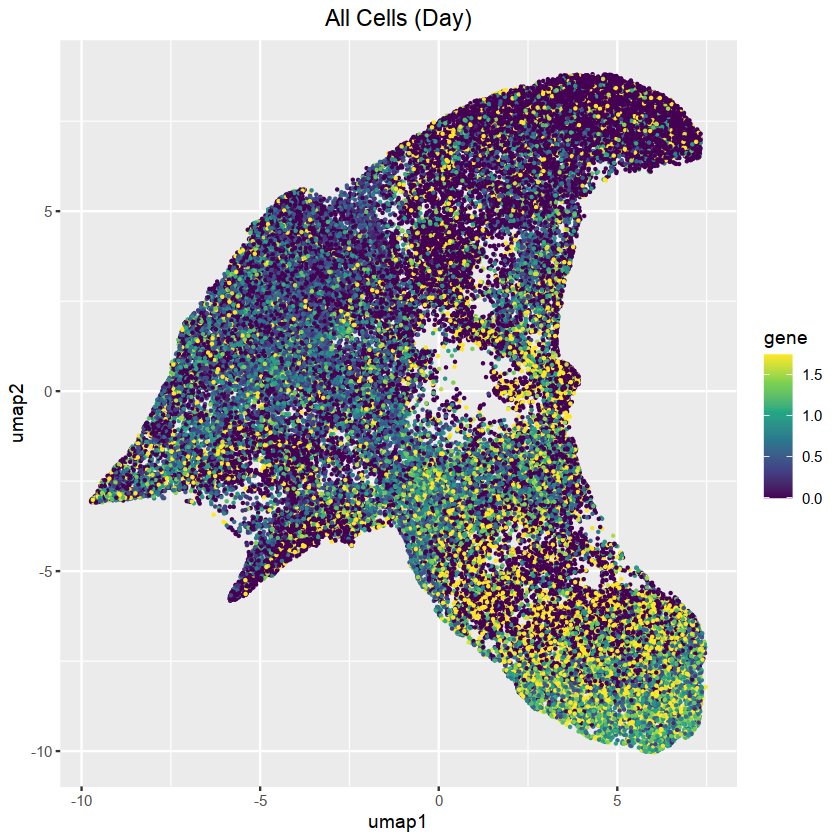

In [331]:
options(repr.plot.width = 7, repr.plot.height = 7)

cur_gene = as.numeric(archr_gene_score_mat["FN1",])
df = data.frame(metaData, gene=cur_gene)
# shuffle so days don't overlap
df = df[sample(dim(df)[1]), ]

ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.2, alpha=1, aes(x=umap1 , y=umap2, col=gene)) +
# scale_color_brewer(breaks=DAYS, palette = "Set1") +
ggtitle("All Cells (Day)") + 
scale_color_viridis_c(limits=c(quantile(cur_gene, .1),
                               quantile(cur_gene, .9)), oob=squish) +
theme(plot.title = element_text(hjust = 0.5)) 
# guides(colour = guide_legend(override.aes = list(shape=16, alpha=1, size=4))) 

## Integration

In [313]:
# atac.seurat = CreateSeuratObject(counts = raw_gene_score, assay = "ACTIVITY", project="scATAC")
atac.seurat = CreateSeuratObject(counts = archr_gene_score_mat, assay = "ACTIVITY", project="scATAC")
atac.seurat[['clusters']] = factor(as.numeric(metaData$cluster))
atac.seurat[['clusters_new_id']] = factor(cluster_config[as.numeric(metaData$cluster), "new_cluster"])
atac.seurat$tech <- "atac"

atac.seurat <- FindVariableFeatures(atac.seurat)
atac.seurat <- NormalizeData(atac.seurat)
atac.seurat <- ScaleData(atac.seurat)

In [303]:
# following vignette -- not really required
# atac.seurat[["ATAC"]] <- CreateAssayObject(counts = tpmat)
# DefaultAssay(atac.seurat) <- "ATAC"
# VariableFeatures(atac.seurat) <- names(which(Matrix::rowSums(atac.seurat) > 100))
# atac.seurat <- RunLSI(atac.seurat, n = 50, scale.max = NULL)
# atac.seurat <- RunUMAP(atac.seurat, reduction = "lsi", dims = 1:15)

In [ ]:
transfer.anchors <- FindTransferAnchors(reference = rna, query = atac.seurat, features = VariableFeatures(object = rna), 
    reference.assay = "RNA", query.assay = "ACTIVITY", reduction = "cca")

Warning message in RunCCA.Seurat(object1 = reference, object2 = query, features = features, :
“Running CCA on different assays”
Running CCA

Merging objects

Finding neighborhoods



In [44]:
transfer.anchors

An AnchorSet object containing 3799 anchors between 1 Seurat objects 
 This can be used as input to IntegrateData or TransferData.

In [ ]:
# trying to use precomputed feats
atac.seurat[["ATAC"]] <- CreateAssayObject(counts = t(atac.feats))
DefaultAssay(atac.seurat) <- "ATAC"

In [ ]:
atac.seurat@reductions$diffmap = CreateDimReducObject(embeddings=as.matrix(atac.feats), 
                                           loadings=matrix(, nrow = 0, ncol = 0),
                                           key="diffmap",
                                           assay="ATAC")

In [ ]:
atac.seurat@reductions$umap = CreateDimReducObject(embeddings=as.matrix(metaData[,c("umap1", "umap2")]),
                                                  loadings=matrix(,nrow=0,ncol=0),
                                                  key="umap",
                                                  assay="ATAC")

In [ ]:
celltype.predictions <- TransferData(anchorset = transfer.anchors, refdata = rna$seurat_clusters, 
    weight.reduction = atac.seurat[["diffmap"]], dims=1:9)

In [ ]:
atac.seurat <- AddMetaData(atac.seurat, metadata = celltype.predictions)

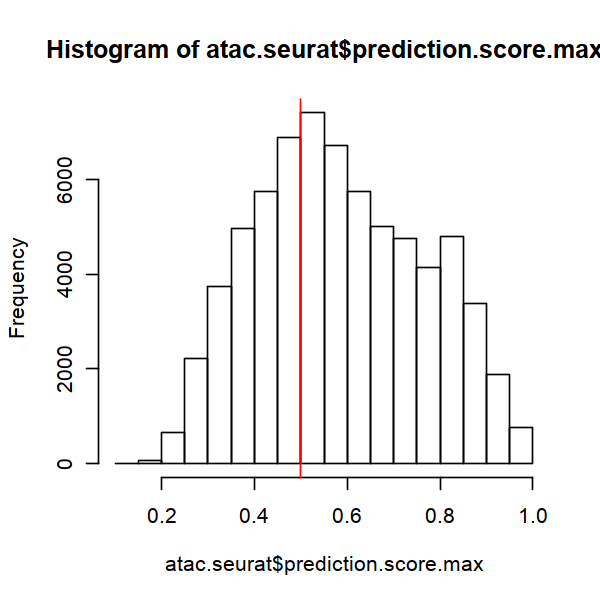

In [47]:
options(repr.plot.width = 5, repr.plot.height = 5)

hist(atac.seurat$prediction.score.max)
abline(v = 0.5, col = "red")

In [48]:
cxc_cor_mat = cor(celltype.predictions[, paste("prediction.score", sort(unique(rna$seurat_clusters)), sep=".")])

Warning message in melt(cxc_cor_mat):
“The melt generic in data.table has been passed a matrix and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is deprecated, and this redirection is now deprecated as well. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace like reshape2::melt(cxc_cor_mat). In the next version, this warning will become an error.”


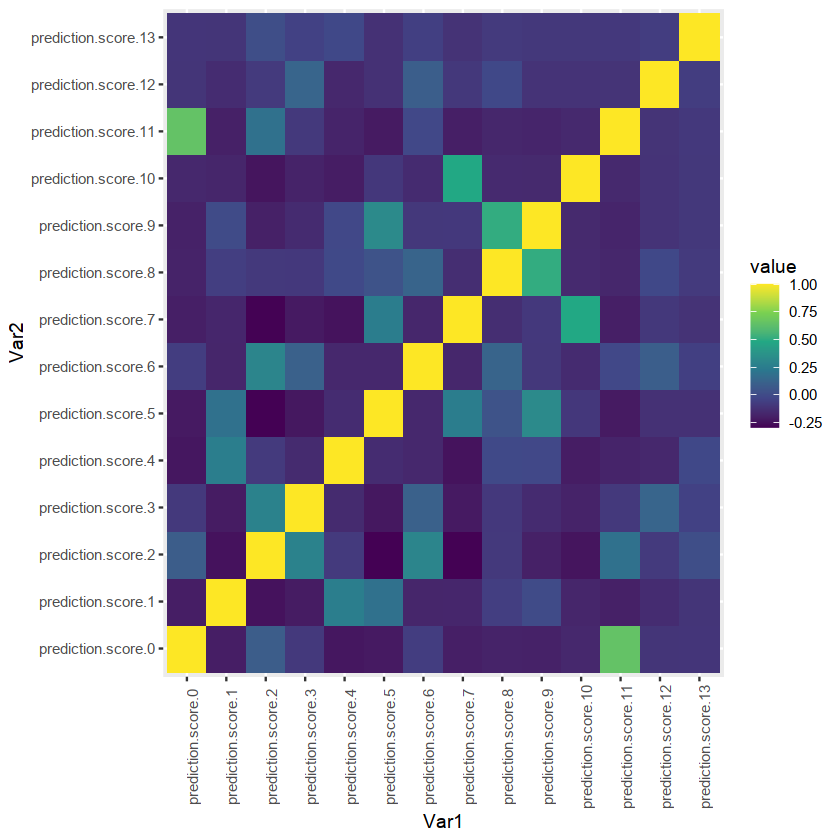

In [49]:
options(repr.plot.width = 7, repr.plot.height = 7)

ggplot(melt(cxc_cor_mat)) +
geom_tile(aes(x=Var1,y=Var2,fill=value)) +
scale_fill_viridis_c() +
theme(axis.text.x = element_text(angle = 90))

Warning message:
“Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session.”


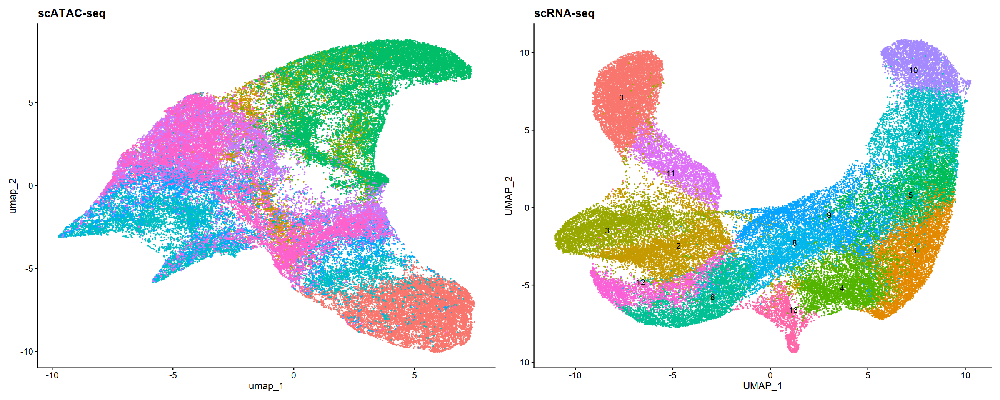

In [50]:
options(repr.plot.width = 20, repr.plot.height = 8)

p1 <- DimPlot(atac.seurat, group.by="orig.ident", reduction = "umap") + NoLegend() + ggtitle("scATAC-seq")
p2 <- DimPlot(rna, group.by = "seurat_clusters", label = TRUE, repel = TRUE) + NoLegend() + ggtitle("scRNA-seq")
p1 + p2

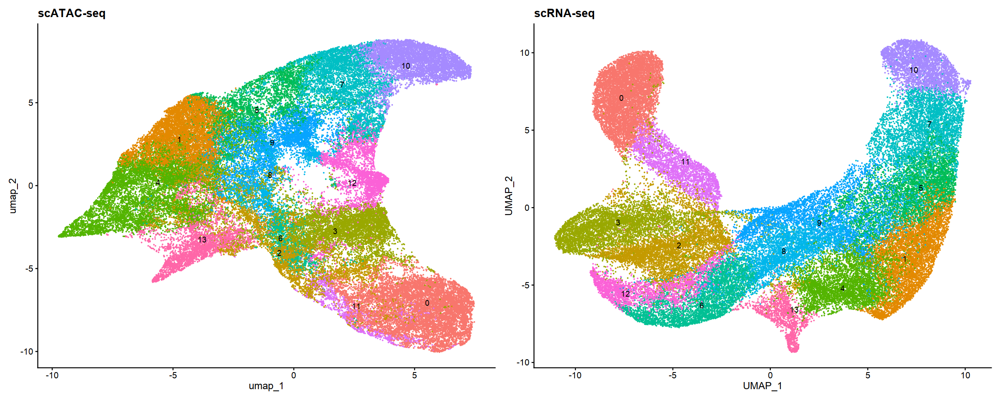

In [51]:
options(repr.plot.width = 20, repr.plot.height = 8)

atac.seurat$predicted.id <- factor(atac.seurat$predicted.id, levels = levels(rna))  # to make the colors match
p1 <- DimPlot(atac.seurat, group.by="predicted.id", label=T, repel=T) + NoLegend() + ggtitle("scATAC-seq") + scale_colour_hue(drop = FALSE)
p2 <- DimPlot(rna, group.by = "seurat_clusters", label = TRUE, repel = TRUE) + NoLegend() + ggtitle("scRNA-seq")
p1 + p2

In [ ]:
# note that we restrict the imputation to variable genes from scRNA-seq, but could impute the
# full transcriptome if we wanted to
genes.use <- VariableFeatures(rna)
refdata <- GetAssayData(rna, assay = "RNA", slot = "data")[genes.use, ]

# refdata (input) contains a scRNA-seq expression matrix for the scRNA-seq cells.  imputation
# (output) will contain an imputed scRNA-seq matrix for each of the ATAC cells
imputation <- TransferData(anchorset = transfer.anchors, refdata = refdata, weight.reduction = atac.seurat[["diffmap"]], dims=1:9)

# this line adds the imputed data matrix to the pbmc.atac object
atac.seurat[["RNA"]] <- imputation
coembed <- merge(x = rna, y = atac.seurat)

# Finally, we run PCA and UMAP on this combined object, to visualize the co-embedding of both
# datasets
coembed <- ScaleData(coembed, features = genes.use, do.scale = FALSE)
coembed <- RunPCA(coembed, features = genes.use, verbose = FALSE)
coembed <- RunUMAP(coembed, dims = 1:30)
coembed$celltype <- ifelse(!is.na(coembed$seurat_clusters), coembed$seurat_clusters, coembed$predicted.id)

In [65]:
coembed <- RunUMAP(coembed, dims = 1:6)

00:53:36 UMAP embedding parameters a = 0.9922 b = 1.112

00:53:36 Read 128285 rows and found 6 numeric columns

00:53:36 Using Annoy for neighbor search, n_neighbors = 30

00:53:36 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

|

00:54:00 Writing NN index file to temp file /tmp/Rtmpm9hm9X/file96a372099d46

00:54:00 Searching Annoy index using 1 thread, search_k = 3000

00:54:54 Annoy recall = 100%

00:54:55 Commencing smooth kNN distance calibration using 1 thread

00:55:04 Initializing from normalized Laplacian + noise

00:55:25 Commencing optimization for 200 epochs, with 4901940 positive edges

00:56:37 Optimization finished



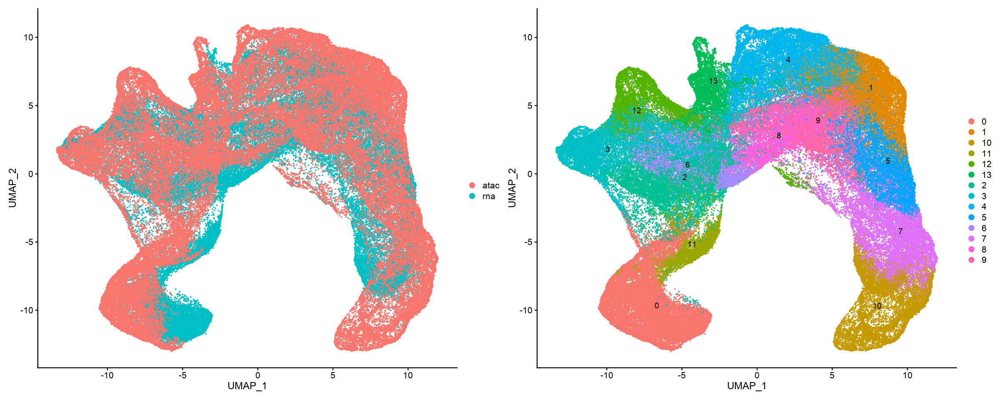

In [66]:
options(repr.plot.width = 20, repr.plot.height = 8)

p1 <- DimPlot(coembed, group.by = "tech")
p2 <- DimPlot(coembed, group.by = "celltype", label = TRUE, repel = TRUE)
p1 + p2

## ATAC -> RNA

In [ ]:
transfer.anchors.atac.to.rna <- FindTransferAnchors(reference = atac.seurat, query = rna, features = VariableFeatures(object = rna), 
    reference.assay = "ACTIVITY", query.assay = "RNA", reduction = "cca")

In [46]:
transfer.anchors.atac.to.rna

An AnchorSet object containing 6033 anchors between 1 Seurat objects 
 This can be used as input to IntegrateData or TransferData.

In [332]:
atac2rna.predictions <- TransferData(anchorset = transfer.anchors.atac.to.rna, refdata = atac.seurat$clusters_new_id, 
    weight.reduction = rna[["pca"]])

Finding integration vectors

Finding integration vector weights

Predicting cell labels



In [333]:
rna <- AddMetaData(rna, metadata = atac2rna.predictions)

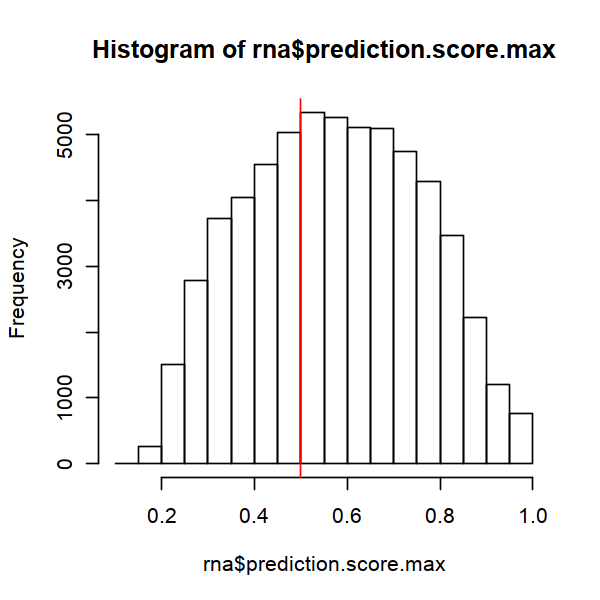

In [316]:
options(repr.plot.width = 5, repr.plot.height = 5)

hist(rna$prediction.score.max)
abline(v = 0.5, col = "red")

In [349]:
cxc_cor_mat = cor(atac2rna.predictions[, paste("prediction.score", sort(unique(atac.seurat$clusters)), sep=".")])

In [355]:
rownames(cxc_cor_mat) = seq(1,nrow(cxc_cor_mat))
colnames(cxc_cor_mat) = seq(1,nrow(cxc_cor_mat))

melted_cxc_cor_mat = melt(cxc_cor_mat)
melted_cxc_cor_mat$Var1 = factor(melted_cxc_cor_mat$Var1, levels=seq(1,nrow(cxc_cor_mat)))
melted_cxc_cor_mat$Var2 = factor(melted_cxc_cor_mat$Var2, levels=seq(1,nrow(cxc_cor_mat)))

Warning message in melt(cxc_cor_mat):
"The melt generic in data.table has been passed a matrix and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is deprecated, and this redirection is now deprecated as well. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace like reshape2::melt(cxc_cor_mat). In the next version, this warning will become an error."


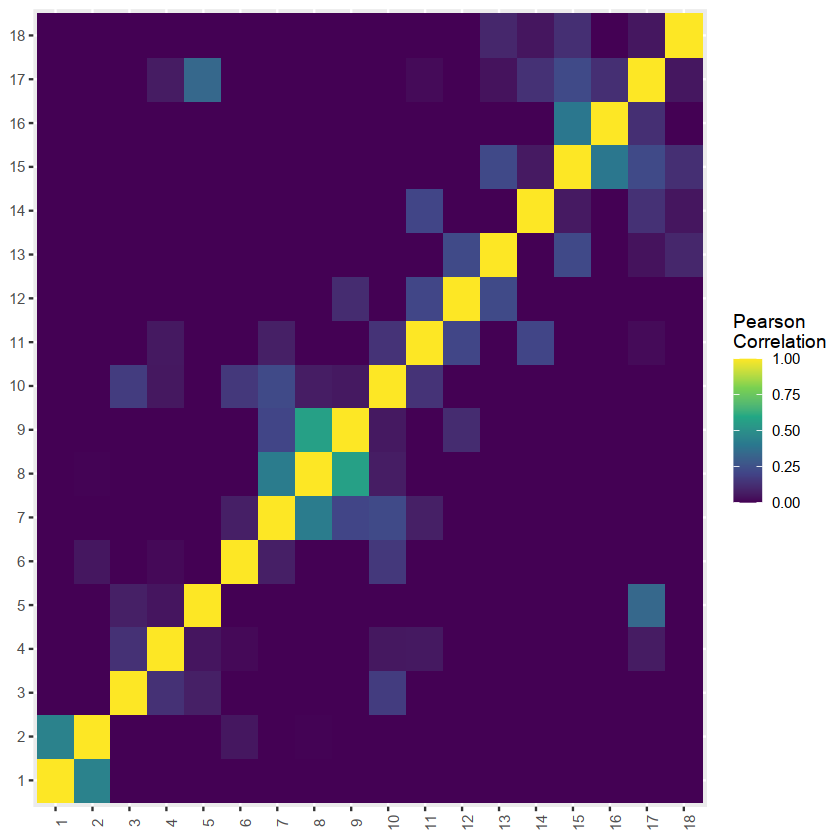

In [360]:
options(repr.plot.width = 7, repr.plot.height = 7)

# these are old cluster IDs (same as MetaData)
ggplot(melted_cxc_cor_mat) +
geom_tile(aes(x=Var1,y=Var2,fill=value)) +
scale_fill_viridis_c(limits=c(0,1),
                     name="Pearson\nCorrelation",
                    oob=squish) +
theme(axis.text.x = element_text(angle = 90),
     axis.title = element_blank())

In [280]:
# map to new IDs
rna$predicted.id.new = cluster_config[as.numeric(rna$predicted.id), "new_cluster"]

[1]    83 59369

In [323]:
table(rna$predicted.id.new)


   1    2    3    4    5    6    7    8    9   10   11   12   13   14   15   16 
6281 4897 5509 8261 2478 2992 1296   58 2840  294 1668 7395 2692 4197 5076 3393 
  17 
  42 

In [320]:
head(colnames(rna))

[1] "AAACCCAAGAGTGACC-1" "AAACCCAAGTGCCAGA-1" "AAACCCACACCATTCC-1"
[4] "AAACCCACACGCGTCA-1" "AAACCCAGTCCATAGT-1" "AAACCCAGTTATTCTC-1"

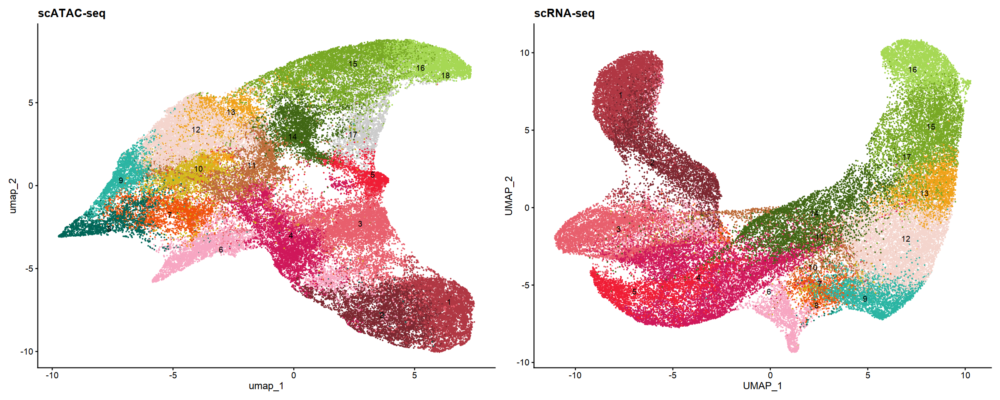

In [324]:
options(repr.plot.width = 20, repr.plot.height = 8)

# new cluster labels
rna$predicted.id <- factor(rna$predicted.id, levels = levels(atac.seurat@meta.data[['clusters_new_id']]))  # to make the colors match
p1 <- DimPlot(atac.seurat, group.by="clusters_new_id", label=T, repel=T) + 
      NoLegend() + 
      ggtitle("scATAC-seq") + 
      scale_color_manual(values=as.character(cluster_config$colour)[order(cluster_config$new_cluster)]) 
p2 <- DimPlot(rna, group.by = "predicted.id.new", label = TRUE, repel = TRUE) + 
      NoLegend() + 
      ggtitle("scRNA-seq") + 
#       scale_colour_hue(drop = FALSE) 
      scale_color_manual(values=as.character(cluster_config$colour)[order(cluster_config$new_cluster)]) 

p1 + p2

In [328]:
# write predicted cluster labels (match to old)
write.table(data.frame(barcode=colnames(rna),
                      sample=rna@meta.data$sample,
                      atac_cluster=rna$predicted.id),
           "./sessions/20200913_n27632/atac.20200520_n68916.cluster.transfer.tsv",
           quote=F,
            sep='\t',
           row.names=F)

In [68]:
coembed$atac_celltype <- as.numeric(c(rna$predicted.id, atac.seurat$clusters))

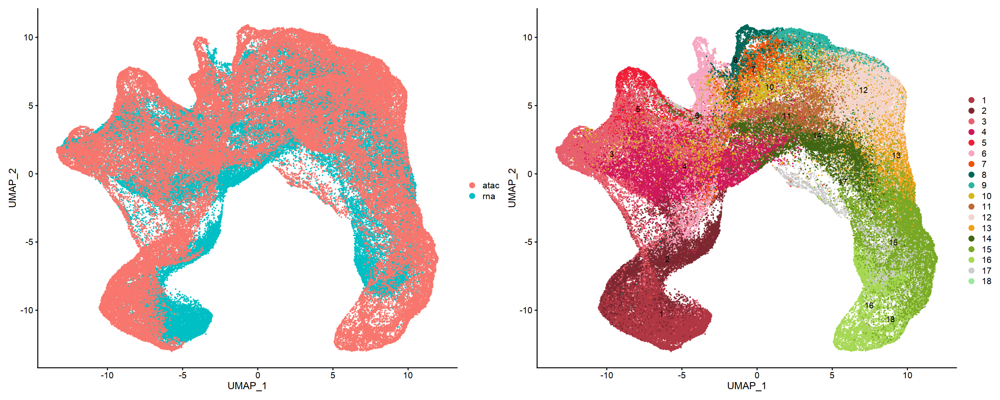

In [70]:
options(repr.plot.width = 20, repr.plot.height = 8)

p1 <- DimPlot(coembed, group.by = "tech")
p2 <- DimPlot(coembed, group.by = "atac_celltype", label = TRUE, repel = TRUE) +
      scale_color_manual(values=as.character(cluster_config$colour)[order(cluster_config$new_cluster)]) 
p1 + p2

---

In [71]:
sessionInfo()

R version 3.6.3 (2020-02-29)
Platform: x86_64-conda_cos6-linux-gnu (64-bit)
Running under: Ubuntu 18.04.4 LTS

Matrix products: default
BLAS/LAPACK: /users/surag/anaconda3/envs/r36_cran/lib/libopenblasp-r0.3.9.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] parallel  stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] BSgenome.Hsapiens.UCSC.hg38_1.4.1 BSgenome_1.54.0                  
 [3] Biostrings_2.54.0                 XVector_0.26.0                   
 [5] ArchR_0.9.1                       magrittr_1.5                     
 [7] rhdf5_2.30.1                      data.table_1.12.8